<a href="https://colab.research.google.com/github/CRISTIANJULIOCESAR/2022-1-iimas-deep/blob/main/UMAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=98b2d74b069f0a6f19156094851c97f3761a60c1913208c6f82882934ebb93e6
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=2cc7b5df1825dd11c7ac65fe4adf2a018cb9e127ad143fa5948a0966cacaa7cd
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [3]:
import pandas as pd
import numpy as np

In [4]:
meta= pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/Clinical data from  tcga.R/metadata.pkl')


In [5]:
df= pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/XGBOOST all shap files/shap_1.pkl')


In [6]:
data=pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/Gene parsing  code /11093rx39979c.pkl')


In [7]:
import umap
# Set a random seed for reproducibility
SEED = 42

# UMAP transformation
reducer = umap.UMAP(
    n_neighbors=1000,  # Default value, can be adjusted based on dataset specifics
    min_dist=0.1,  # Default value, reduces crowding of data points
    metric='cosine',
    n_epochs=500,  # Adjusted from the default 200 to give more stable embeddings
    random_state=SEED,verbose=1  # For reproducibility
)

reduced = reducer.fit_transform(df)


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(angular_rp_forest=True, metric='cosine', n_epochs=500, n_neighbors=1000, random_state=42, verbose=1)
Sun Oct 22 19:29:16 2023 Construct fuzzy simplicial set
Sun Oct 22 19:29:17 2023 Finding Nearest Neighbors
Sun Oct 22 19:29:18 2023 Building RP forest with 10 trees
Sun Oct 22 19:29:28 2023 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	Stopping threshold met -- exiting after 5 iterations
Sun Oct 22 19:58:36 2023 Finished Nearest Neighbor Search
Sun Oct 22 19:58:44 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Oct 22 19:59:49 2023 Finished embedding


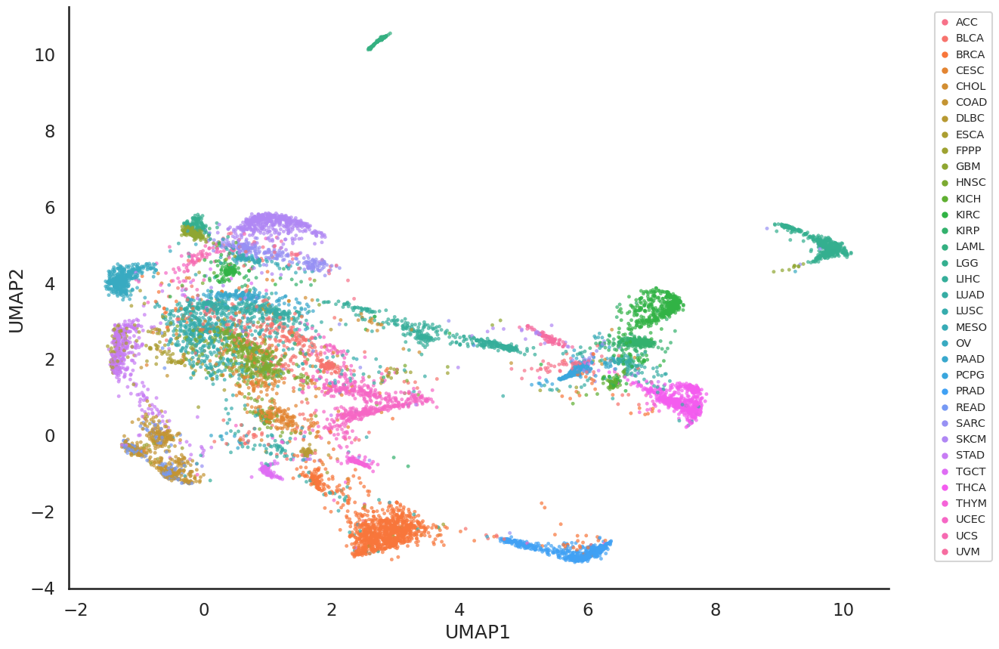

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a new DataFrame for the reduced data
umap_df = pd.DataFrame(reduced, columns=['UMAP1', 'UMAP2'], index=df.index)
umap_df['class'] = meta['panel'].astype('category')

# Set style without gridlines
sns.set_style("white")
sns.set_context("talk")
# Determine the number of unique classes
num_classes = umap_df['class'].nunique()

# Seaborn scatter plot with a categorical palette
plt.figure(figsize=(14, 10))

scatter = sns.scatterplot(
    data=umap_df, x='UMAP1', y='UMAP2', hue='class',
    palette=sns.color_palette("husl", num_classes),
    edgecolor=None, s=10, alpha=0.7
)

# Adjust the legend box size
plt.legend(
    bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='xx-small',
    markerscale=0.5, handlelength=1, handletextpad=0.5
)

# Removing top and right spines for aesthetics
sns.despine()

plt.show()

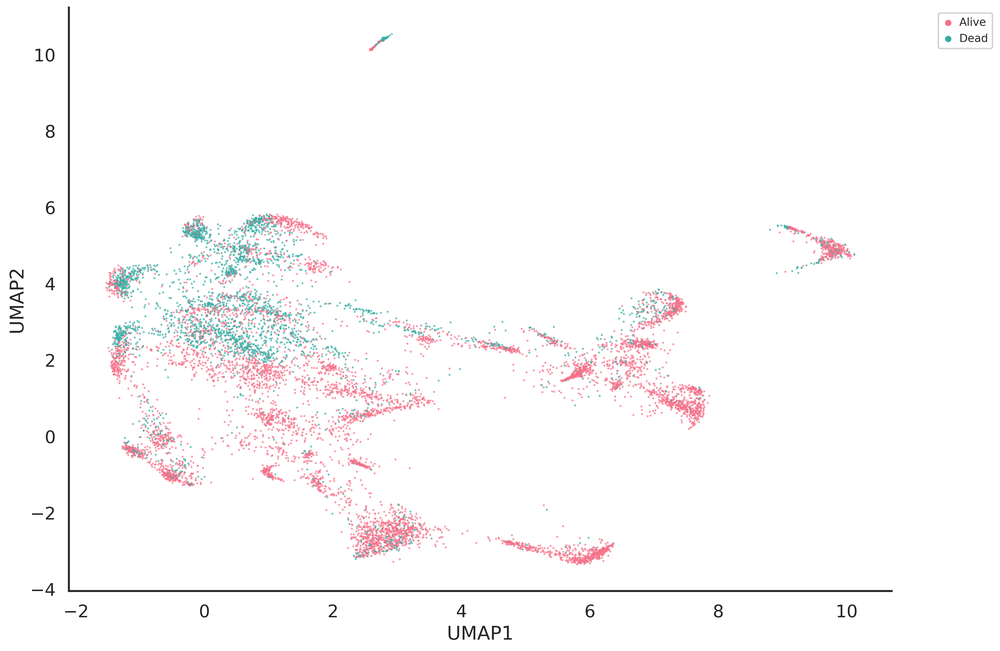

In [23]:

import seaborn as sns
import matplotlib.pyplot as plt

# Create a new DataFrame for the reduced data
umap_df = pd.DataFrame(reduced, columns=['UMAP1', 'UMAP2'], index=df.index)
umap_df['vital'] = meta['vital'].astype('category')

# Set style without gridlines
sns.set_style("white")
sns.set_context("talk")
# Determine the number of unique classes
num_classes = umap_df['vital'].nunique()

# Seaborn scatter plot with a categorical palette
plt.figure(figsize=(14, 10), dpi=600)  # Added dpi for higher resolution

scatter = sns.scatterplot(
    data=umap_df, x='UMAP1', y='UMAP2', hue='vital',
    palette=sns.color_palette("husl", num_classes),
    edgecolor=None, s=3, alpha=0.7
)

# Adjust the legend box size
plt.legend(
    bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='xx-small',
    markerscale=0.5, handlelength=1, handletextpad=0.5
)

# Removing top and right spines for aesthetics
sns.despine()

plt.savefig("high_res_plot.png", dpi=600)  # Save the plot as a file with high resolution
plt.show()


In [10]:
GENE='ZFPM2-AS1'
umap_df[GENE] = data[GENE]
umap_df

,UMAP1,UMAP2,vital,ZFPM2-AS1
Unnamed: 0,,,,
84fd87d4-9b47-4852-b45c-1f681a58832c,9.726170,4.759691,Alive,4
2da36252-af74-4e0c-ae38-5f5fc6bdad6e,9.764622,5.114046,Alive,6
83acd71c-c12a-4394-ba8d-05e9c5ad2cf1,2.612552,-2.908580,Alive,3
04d7ee0b-95ce-4af2-8140-547e9c6bd187,-0.325983,2.257787,Alive,9
171f45e7-83e7-4286-970a-0dafa6f46d8a,0.639962,1.815404,Alive,135
...,...,...,...,...
21ea6561-2bd1-4a3d-ae70-3c504530bb26,-0.161015,2.737351,Dead,56
5d98ad4a-483f-4032-ae9e-0ab6d398da98,2.778278,10.369256,Dead,0
3a74e5d3-48e7-4df9-85e1-dd02d1c804c1,2.731675,-2.887007,Alive,9


<ipython-input-11-9b9f2334d53f>:23: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


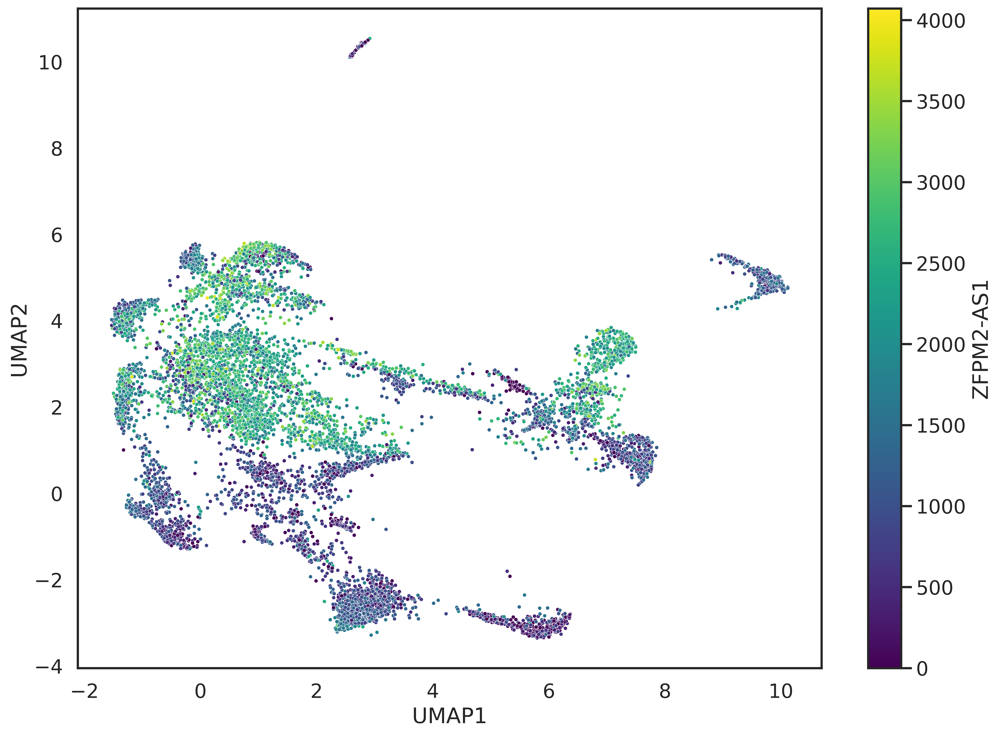

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Establecer estilo sin líneas de cuadrícula
sns.set_style("white")
plt.figure(figsize=(14, 10), dpi=600)  # Added dpi for higher resolution

# Crear un gráfico de dispersión con una escala de color continua
sns.scatterplot(x=umap_df['UMAP1'], y=umap_df['UMAP2'], c=np.log(umap_df['ZFPM2-AS1'] +1), cmap='viridis', s=10)  # Aquí he añadido s=10 para reducir el tamaño de los puntos

# Añadir etiquetas y título
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Obtener los valores de color para el gráfico de dispersión
color_values = umap_df['ZFPM2-AS1']

# Crear una barra de colores usando los valores de color
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(color_values)

# Añadir una barra de colores a la derecha del gráfico
cbar = plt.colorbar(sm)
cbar.set_label('ZFPM2-AS1')

# Mostrar el gráfico
plt.show()


<ipython-input-12-c09a1c7e148c>:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


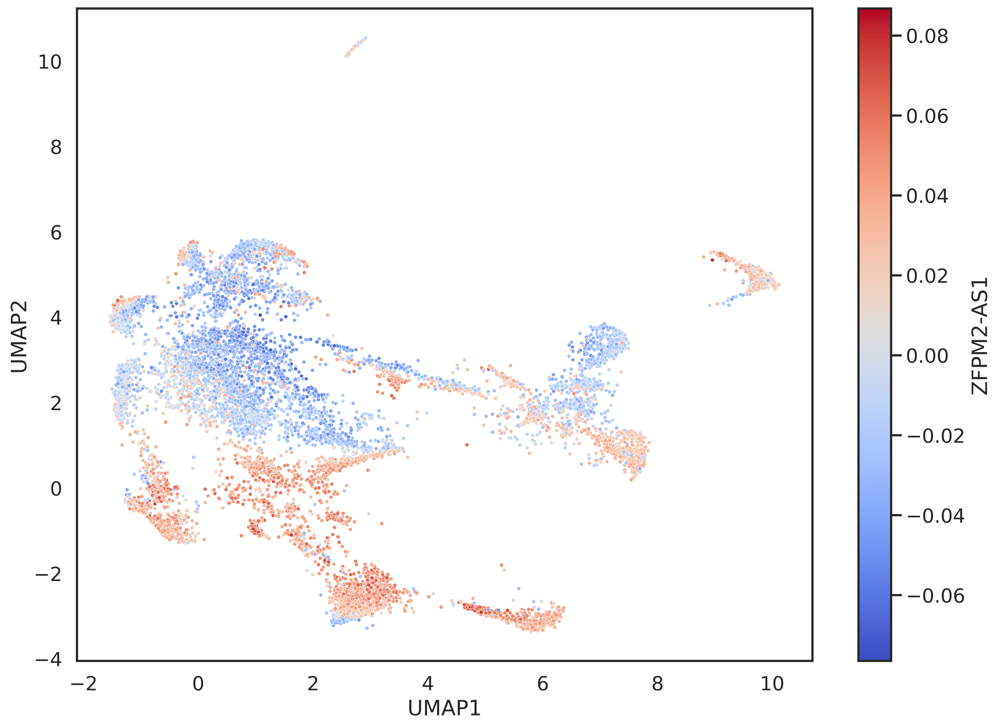

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
#now with shaps
GENE='ZFPM2-AS1'
umap_df[GENE] = df[GENE]
umap_df

# Establecer estilo sin líneas de cuadrícula
sns.set_style("white")
plt.figure(figsize=(14, 10), dpi=600)  # Added dpi for higher resolution

# Crear un gráfico de dispersión con una escala de color continua
sns.scatterplot(x=umap_df['UMAP1'], y=umap_df['UMAP2'], c=umap_df['ZFPM2-AS1'], cmap='coolwarm', s=10)  # Aquí he añadido s=10 para reducir el tamaño de los puntos

# Añadir etiquetas y título
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Obtener los valores de color para el gráfico de dispersión
color_values = umap_df['ZFPM2-AS1']

# Crear una barra de colores usando los valores de color
sm = plt.cm.ScalarMappable(cmap='coolwarm')
sm.set_array(color_values)

# Añadir una barra de colores a la derecha del gráfico
cbar = plt.colorbar(sm)
cbar.set_label('ZFPM2-AS1')

# Mostrar el gráfico
plt.show()

In [17]:


import umap
# Set a random seed for reproducibility
SEED = 42

# UMAP transformation
reducer = umap.UMAP(
    n_neighbors=15,  # Default value, can be adjusted based on dataset specifics
    min_dist=0.1,  # Default value, reduces crowding of data points
    metric='cosine',
    n_epochs=500,  # Adjusted from the default 200 to give more stable embeddings
    random_state=SEED,verbose=1  # For reproducibility
)

reduced_raw = reducer.fit_transform(np.log(data +1))


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(angular_rp_forest=True, metric='cosine', n_epochs=500, random_state=42, verbose=1)
Sun Oct 22 20:08:15 2023 Construct fuzzy simplicial set
Sun Oct 22 20:08:16 2023 Finding Nearest Neighbors
Sun Oct 22 20:08:16 2023 Building RP forest with 10 trees
Sun Oct 22 20:08:23 2023 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	Stopping threshold met -- exiting after 4 iterations
Sun Oct 22 20:08:41 2023 Finished Nearest Neighbor Search
Sun Oct 22 20:08:42 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Oct 22 20:09:05 2023 Finished embedding


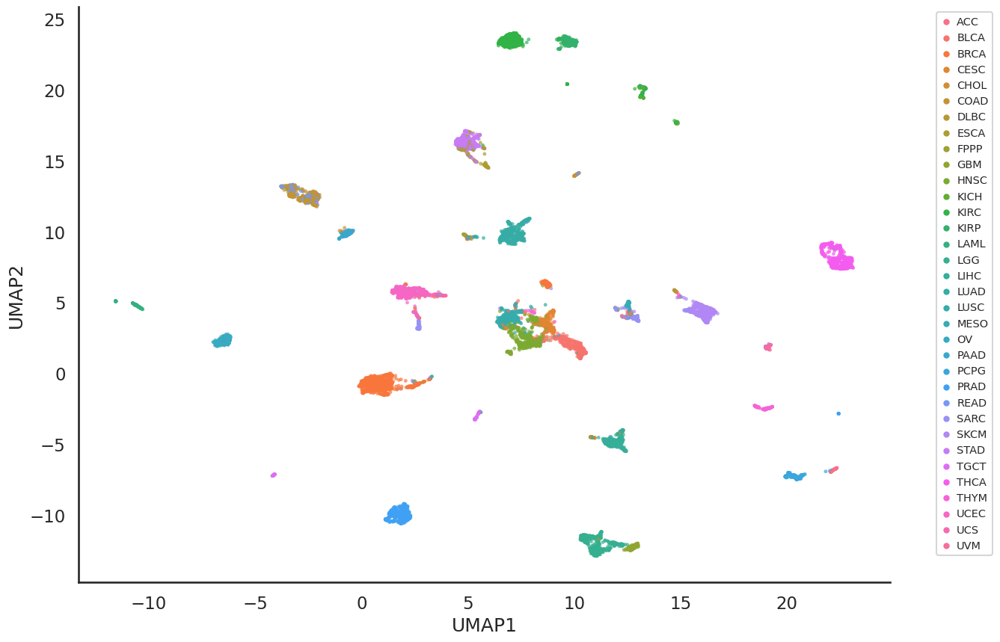

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a new DataFrame for the reduced data
umap_df = pd.DataFrame(reduced_raw, columns=['UMAP1', 'UMAP2'], index=data.index)
umap_df['class'] = meta['panel'].astype('category')

# Set style without gridlines
sns.set_style("white")
sns.set_context("talk")
# Determine the number of unique classes
num_classes = umap_df['class'].nunique()

# Seaborn scatter plot with a categorical palette
plt.figure(figsize=(14, 10))

scatter = sns.scatterplot(
    data=umap_df, x='UMAP1', y='UMAP2', hue='class',
    palette=sns.color_palette("husl", num_classes),
    edgecolor=None, s=10, alpha=0.7
)

# Adjust the legend box size
plt.legend(
    bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='xx-small',
    markerscale=0.5, handlelength=1, handletextpad=0.5
)

# Removing top and right spines for aesthetics
sns.despine()

plt.show()

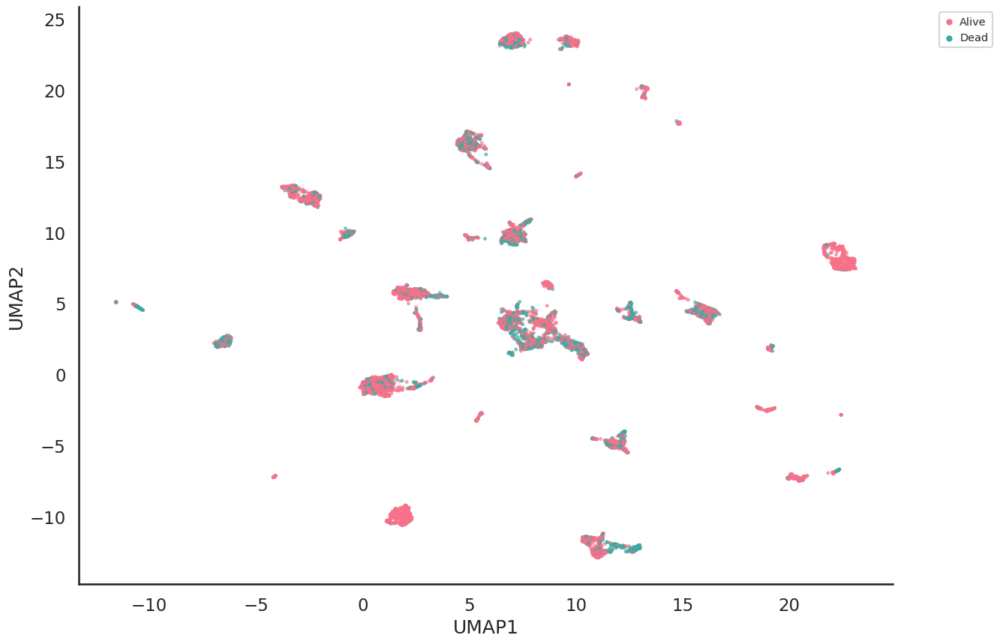

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a new DataFrame for the reduced data
umap_df = pd.DataFrame(reduced_raw, columns=['UMAP1', 'UMAP2'], index=data.index)
umap_df['class'] = meta['vital'].astype('category')

# Set style without gridlines
sns.set_style("white")
sns.set_context("talk")
# Determine the number of unique classes
num_classes = umap_df['class'].nunique()

# Seaborn scatter plot with a categorical palette
plt.figure(figsize=(14, 10))

scatter = sns.scatterplot(
    data=umap_df, x='UMAP1', y='UMAP2', hue='class',
    palette=sns.color_palette("husl", num_classes),
    edgecolor=None, s=10, alpha=0.7
)

# Adjust the legend box size
plt.legend(
    bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='xx-small',
    markerscale=0.5, handlelength=1, handletextpad=0.5
)

# Removing top and right spines for aesthetics
sns.despine()

plt.show()

<ipython-input-22-c09a1c7e148c>:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


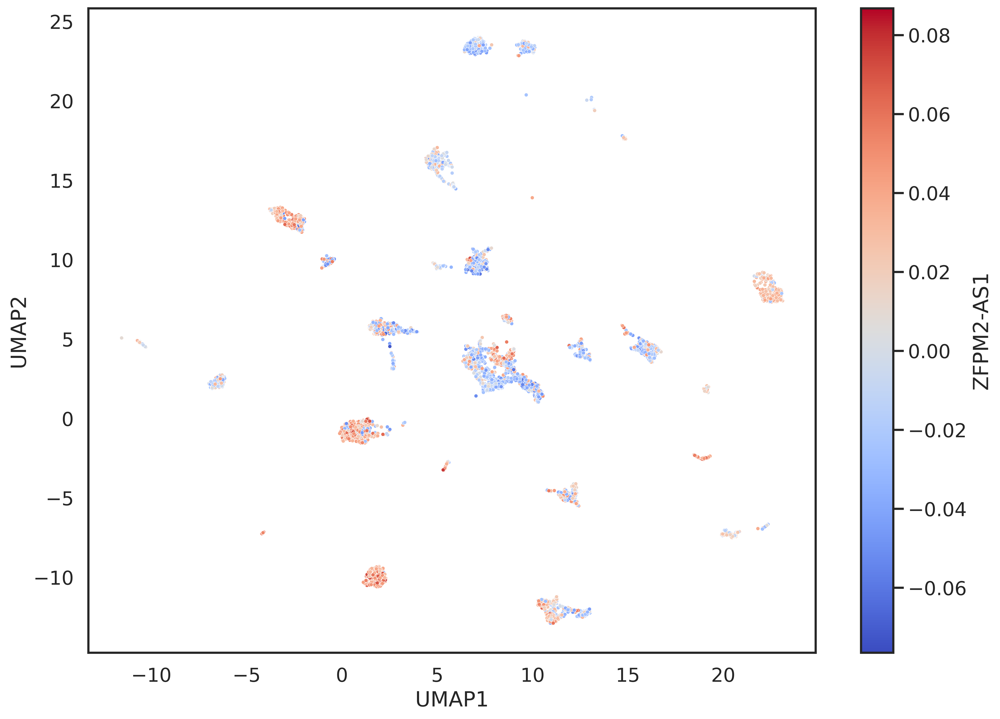

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
#now with shaps
GENE='ZFPM2-AS1'
umap_df[GENE] = df[GENE]
umap_df

# Establecer estilo sin líneas de cuadrícula
sns.set_style("white")
plt.figure(figsize=(14, 10), dpi=600)  # Added dpi for higher resolution

# Crear un gráfico de dispersión con una escala de color continua
sns.scatterplot(x=umap_df['UMAP1'], y=umap_df['UMAP2'], c=umap_df['ZFPM2-AS1'], cmap='coolwarm', s=10)  # Aquí he añadido s=10 para reducir el tamaño de los puntos

# Añadir etiquetas y título
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Obtener los valores de color para el gráfico de dispersión
color_values = umap_df['ZFPM2-AS1']

# Crear una barra de colores usando los valores de color
sm = plt.cm.ScalarMappable(cmap='coolwarm')
sm.set_array(color_values)

# Añadir una barra de colores a la derecha del gráfico
cbar = plt.colorbar(sm)
cbar.set_label('ZFPM2-AS1')

# Mostrar el gráfico
plt.show()